In [ ]:
!pip install -q torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install -q ultralytics albumentations opencv-python-headless
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 12.7 MB/s eta 0:00:00


In [ ]:
!pip install -q "tensorflow==2.19.0"
!pip install -q "opencv-python-headless"
!pip install -q albumentations tqdm wandb

In [ ]:
import numpy as np
import os
import seaborn as sns
from collections import Counter
from matplotlib import pyplot as plt
import cv2
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch
import torchvision
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix
import json
from google.colab import files
from PIL import Image
import io

In [ ]:
# 1. Conectar ao Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Carregamento e inspeção dos dados**

In [ ]:
def count_images_in_subfolders(path):
    counts = {}
    for subset in os.listdir(path):  # train, val, test
        subset_path = os.path.join(path, subset)
        if os.path.isdir(subset_path):
            counts[subset] = {}
            for cls in os.listdir(subset_path):
                cls_path = os.path.join(subset_path, cls)
                if os.path.isdir(cls_path):
                    counts[subset][cls] = len([
                        f for f in os.listdir(cls_path)
                        if f.lower().endswith(('.jpg', '.png', '.jpeg'))
                    ])
    return counts

train_root = '/content/drive/MyDrive/Dataserts_Projeto PI/Dataset_teste/DatasetPI_teste'
print(count_images_in_subfolders(train_root))


{'train': {'vaca': 600, 'cavalo': 600, 'Ovelha': 209}, 'val': {'vaca': 300, 'cavalo': 300, 'Ovelha': 153}, 'test': {'cavalo': 150, 'vaca': 150, 'Ovelha': 209}}


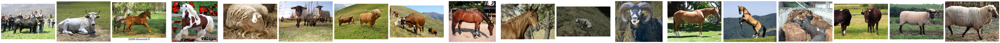

In [ ]:
train_root = '/content/drive/MyDrive/Dataserts_Projeto PI/Dataset_teste/DatasetPI_teste'
sample = []

# Iterate through the subdirectories (e.g., 'train', 'val', 'test')
for split_folder in os.listdir(train_root):
    split_path = os.path.join(train_root, split_folder)
    if os.path.isdir(split_path):
        # Iterate through the class subdirectories within each split (e.g., 'vaca', 'cavalo')
        for class_folder in os.listdir(split_path):
            class_path = os.path.join(split_path, class_folder)
            if os.path.isdir(class_path):
                # Now, list the actual image files in the class folder
                image_files = [os.path.join(class_path, f) for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
                # Add up to 2 image paths from each class to the sample
                sample.extend(image_files[:2])

if not sample:
    print(f"No image files found in '{train_root}' following the 'split/class/image.jpg' structure.")
else:
    num_images = len(sample)
    fig, axs = plt.subplots(1, num_images, figsize=(num_images * 5, 4))

    # Ensure axs is iterable even if num_images is 1
    if num_images == 1:
        axs = [axs]

    for i, p in enumerate(sample):
        img = cv2.imread(p)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axs[i].imshow(img)
            axs[i].axis('off')
        else:
            print(f"Warning: Could not read image at {p}. It might be corrupted or not a valid image file.")
    plt.tight_layout()
    plt.show()

# **Pipeline de pré-processamento e augmentations**

In [ ]:
train_transform = A.Compose([
    A.RandomResizedCrop(size=(224, 224), scale=(0.7,1.0)),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.3),
    A.Normalize(),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Resize(height=224, width=224),
    A.Normalize(),
    ToTensorV2()
])

/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


In [ ]:
import numpy as np
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import class_weight # Import class_weight

# Re-define necessary variables from yCVN9gRmMt37 to ensure train_gen is available
train_dir = '/content/drive/MyDrive/Dataserts_Projeto PI/Dataset_teste/DatasetPI_teste/train'
val_dir   = '/content/drive/MyDrive/Dataserts_Projeto PI/Dataset_teste/DatasetPI_teste/val'
batch_size = 32
img_size = (224, 224)

# 3) Geradores de Imagens (Data Augmentation) - Modified to remove rescale
train_gen = ImageDataGenerator(
    horizontal_flip=True,
    rotation_range=15,
    width_shift_range=0.05,
    height_shift_range=0.05,
    brightness_range=(0.8, 1.2)
).flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

val_gen = ImageDataGenerator().flow_from_directory(
    val_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# 1. Get the class counts from the train_gen.classes attribute
class_labels = train_gen.classes

# 2. Use sklearn.utils.class_weight.compute_class_weight to calculate class weights
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(class_labels),
    y=class_labels
)

# 3. Convert the calculated class weights into a dictionary
class_weights = dict(enumerate(class_weights_array))

print("Calculated Class Weights:", class_weights)

Found 1409 images belonging to 3 classes.
Found 753 images belonging to 3 classes.
Calculated Class Weights: {0: np.float64(2.2472089314194577), 1: np.float64(0.7827777777777778), 2: np.float64(0.7827777777777778)}


In [ ]:
# 1. Get the class counts from the train_gen.classes attribute
class_labels = train_gen.classes

# 2. Use sklearn.utils.class_weight.compute_class_weight to calculate class weights
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(class_labels),
    y=class_labels
)

# 3. Convert the calculated class weights into a dictionary
class_weights = dict(enumerate(class_weights_array))

print("Calculated Class Weights:", class_weights)

Calculated Class Weights: {0: np.float64(2.2472089314194577), 1: np.float64(0.7827777777777778), 2: np.float64(0.7827777777777778)}


# **Analise Pré-treino**

Classes found: ['Ovelha', 'cavalo', 'vaca']

Displaying sample images for class: Ovelha


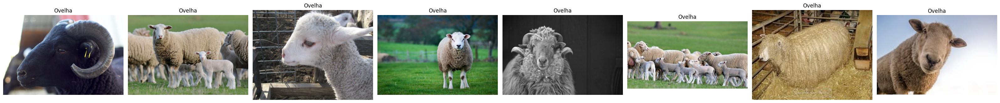


Displaying sample images for class: cavalo


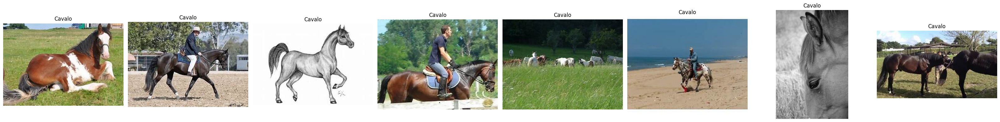


Displaying sample images for class: vaca


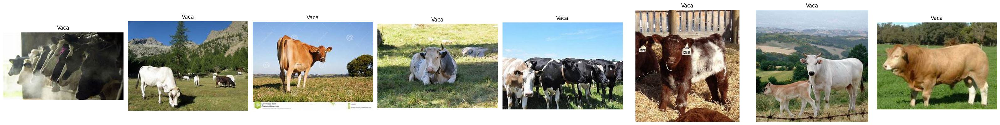

In [ ]:
import matplotlib.pyplot as plt
import random

# Get class names from the train_gen (from previous execution cell `a35f2ea7` or `45db5b71`)
class_names = list(train_gen.class_indices.keys())

# Define the number of images to display per class
num_images_per_class = 8 # Between 5 and 10

print(f"Classes found: {class_names}")

for class_name in class_names:
    print(f"\nDisplaying sample images for class: {class_name}")
    class_path = os.path.join(train_dir, class_name)

    # List all image files in the class directory
    all_images = [
        os.path.join(class_path, f) for f in os.listdir(class_path)
        if f.lower().endswith(('.jpg', '.png', '.jpeg'))
    ]

    # Select a random sample of images
    selected_images = random.sample(all_images, min(len(all_images), num_images_per_class))

    # Create a figure for the current class
    fig, axs = plt.subplots(1, len(selected_images), figsize=(4 * len(selected_images), 4))

    # Ensure axs is iterable even if only one image is selected
    if len(selected_images) == 1:
        axs = [axs]

    for i, img_path in enumerate(selected_images):
        img = cv2.imread(img_path)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axs[i].imshow(img)
            axs[i].set_title(class_name.capitalize())
            axs[i].axis('off')
        else:
            print(f"Warning: Could not read image at {img_path}")

    plt.tight_layout()
    plt.show()

#**Analisar Distribuição de Classes com Gráfico**

DataFrame with image counts:
   Split   Class  Count
0  train    vaca    600
1  train  cavalo    600
2  train  Ovelha    209
3    val    vaca    300
4    val  cavalo    300
5    val  Ovelha    153
6   test  cavalo    150
7   test    vaca    150
8   test  Ovelha    209


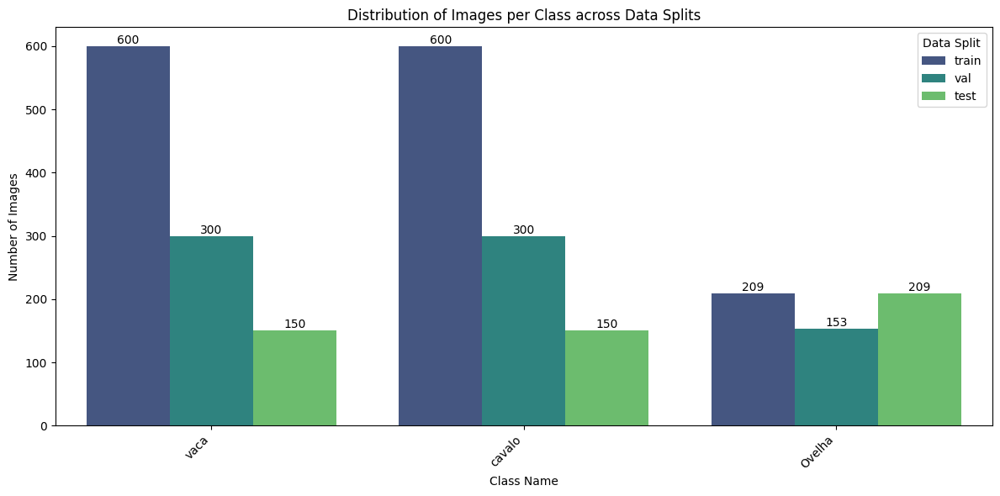

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Reuse the count_images_in_subfolders function
# 'train_root' is defined in previous cells like 'fXab2dPyMcfb'
image_counts_dict = count_images_in_subfolders(train_root)

# 2. Organize these counts into a Pandas DataFrame
data = []
for split, classes in image_counts_dict.items():
    for class_name, count in classes.items():
        data.append({'Split': split, 'Class': class_name, 'Count': count})

df_counts = pd.DataFrame(data)

print("DataFrame with image counts:")
print(df_counts)

# 3. Use Seaborn's barplot to create a bar chart
plt.figure(figsize=(12, 6))
ax = sns.barplot(data=df_counts, x='Class', y='Count', hue='Split', palette='viridis')

# Add numerical labels on top of the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge')

# 4. Add appropriate labels and title
plt.title('Distribution of Images per Class across Data Splits')
plt.xlabel('Class Name')
plt.ylabel('Number of Images')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Data Split')
plt.tight_layout()

# 5. Display the plot
plt.show()

# **Treino — Transfer learning com MobileNetV2 (TensorFlow / Keras)**

In [ ]:
# 4) Base MobileNetV2 congelada
# Re-instantiate the base model to ensure it's not already trained
base = tf.keras.applications.MobileNetV2(
    input_shape=(*img_size, 3),
    include_top=False,
    weights='imagenet'
)

base.trainable = False  # congelar

# 5) Construção do Modelo
inputs = layers.Input(shape=(*img_size, 3))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs) # Apply MobileNetV2's own preprocessing
x = base(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)

outputs = layers.Dense(train_gen.num_classes, activation='softmax')(x)

model = tf.keras.models.Model(inputs, outputs)

# 6) Compilação (Primeira etapa — apenas o topo)
model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# 7) Callbacks (from original cell yCVN9gRmMt37)
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        '/content/drive/MyDrive/Dataserts_Projeto PI/modelo_mobilenet_PI_weighted.keras',
        save_best_only=True,
        monitor='val_loss'
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-6
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=8,
        restore_best_weights=True
    )
]

# 8) Treinamento — Apenas Topo (with class_weights)
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=10,
    callbacks=callbacks,
    class_weight=class_weights # <--- Applying class weights here
)

# 9) Fine-Tuning — Liberar parte da base
base.trainable = True

# Congelar todas as camadas EXCETO as 50 últimas
for layer in base.layers[:-50]:
    layer.trainable = False

model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# 10) Treinamento Final — Fine Tuning (with class_weights)
history_ft = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=15,
    callbacks=callbacks,
    class_weight=class_weights # <--- Applying class weights here
)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 284s 6s/step - accuracy: 0.5738 - loss: 0.9585 - val_accuracy: 0.9150 - val_loss: 0.2947 - learning_rate: 0.0010
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 116s 3s/step - accuracy: 0.8360 - loss: 0.3753 - val_accuracy: 0.9389 - val_loss: 0.2027 - learning_rate: 0.0010
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 107s 2s/step - accuracy: 0.9046 - loss: 0.2613 - val_accuracy: 0.9495 - val_loss: 0.1760 - learning_rate: 0.0010
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 118s 3s/step - accuracy: 0.9010 - loss: 0.2361 - val_accuracy: 0.9469 - val_loss: 0.1642 - learning_rate: 0.0010
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 107s 2s/step - accuracy: 0.9351 - loss: 0.1960 - val_accuracy: 0.9535 - val_loss: 0.1571 - learning_rate: 0.0010
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 106s 2s/step - accuracy: 0.9395 - loss: 0.1517 - val_accuracy: 0.9456 - val_loss: 0.1656 - learning_rate: 0.0010
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - accuracy: 0.9449 - loss: 0.1535 - val_acc

# **Retreinar o Modelo com Pesos de Classe**



In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers

# 4) Base MobileNetV2 congelada
# Re-instantiate the base model to ensure it's not already trained
base = tf.keras.applications.MobileNetV2(
    input_shape=(*img_size, 3),
    include_top=False,
    weights='imagenet'
)

base.trainable = False  # congelar

# 5) Construção do Modelo
inputs = layers.Input(shape=(*img_size, 3))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs) # Apply MobileNetV2's own preprocessing
x = base(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)

outputs = layers.Dense(train_gen.num_classes, activation='softmax')(x)

model = models.Model(inputs, outputs)

# 6) Compilação (Primeira etapa — apenas o topo)
model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# 7) Callbacks (from original cell yCVN9gRmMt37)
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        '/content/drive/MyDrive/Dataserts_Projeto PI/modelo_mobilenet_PI_weighted.keras',
        save_best_only=True,
        monitor='val_loss'
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-6
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=8,
        restore_best_weights=True
    )
]

# 8) Treinamento — Apenas Topo (with class_weights)
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=10,
    callbacks=callbacks,
    class_weight=class_weights # <--- Applying class weights here
)

# 9) Fine-Tuning — Liberar parte da base
base.trainable = True

# Congelar todas as camadas EXCETO as 50 últimas
for layer in base.layers[:-50]:
    layer.trainable = False

model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# 10) Treinamento Final — Fine Tuning (with class_weights)
history_ft = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=15,
    callbacks=callbacks,
    class_weight=class_weights # <--- Applying class weights here
)

Epoch 1/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 124s 3s/step - accuracy: 0.5417 - loss: 1.0093 - val_accuracy: 0.8818 - val_loss: 0.3133 - learning_rate: 0.0010
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 106s 2s/step - accuracy: 0.8454 - loss: 0.3853 - val_accuracy: 0.9323 - val_loss: 0.1958 - learning_rate: 0.0010
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 105s 2s/step - accuracy: 0.8968 - loss: 0.2729 - val_accuracy: 0.9376 - val_loss: 0.1796 - learning_rate: 0.0010
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 115s 3s/step - accuracy: 0.9035 - loss: 0.2321 - val_accuracy: 0.9575 - val_loss: 0.1601 - learning_rate: 0.0010
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 106s 2s/step - accuracy: 0.9353 - loss: 0.1712 - val_accuracy: 0.9522 - val_loss: 0.1494 - learning_rate: 0.0010
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 104s 2s/step - accuracy: 0.9399 - loss: 0.1625 - val_accuracy: 0.9628 - val_loss: 0.1422 - learning_rate: 0.0010
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 107s 2s/step - accuracy: 0.9349 - loss: 0.1609 - val_acc

# **Avaliação do Modelo (gráficos + métricas)**

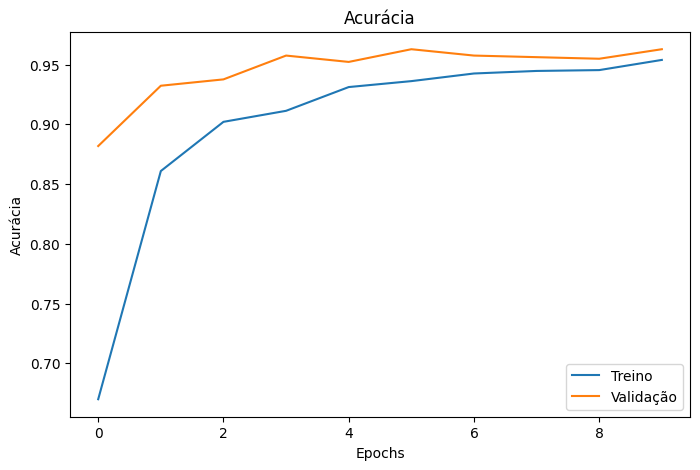

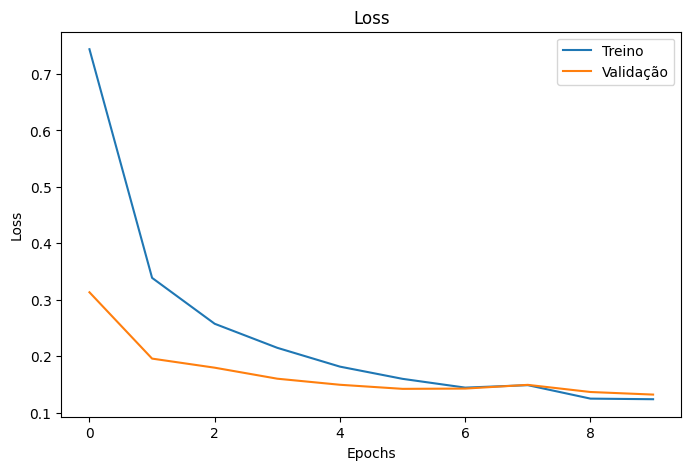

In [ ]:
# -----------------------
# Plot de Acurácia
# -----------------------
plt.figure(figsize=(8,5))
plt.plot(history.history['accuracy'], label='Treino')
plt.plot(history.history['val_accuracy'], label='Validação')
plt.title("Acurácia")
plt.xlabel("Epochs")
plt.ylabel("Acurácia")
plt.legend()
plt.show()

# -----------------------
# Plot de Loss
# -----------------------
plt.figure(figsize=(8,5))
plt.plot(history.history['loss'], label='Treino')
plt.plot(history.history['val_loss'], label='Validação')
plt.title("Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()


# **Matriz de Confusão + Relatório de Classificação**

24/24 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step
              precision    recall  f1-score   support

      Ovelha       0.20      0.20      0.20       153
      cavalo       0.40      0.43      0.41       300
        vaca       0.41      0.38      0.39       300

    accuracy                           0.36       753
   macro avg       0.33      0.33      0.33       753
weighted avg       0.36      0.36      0.36       753



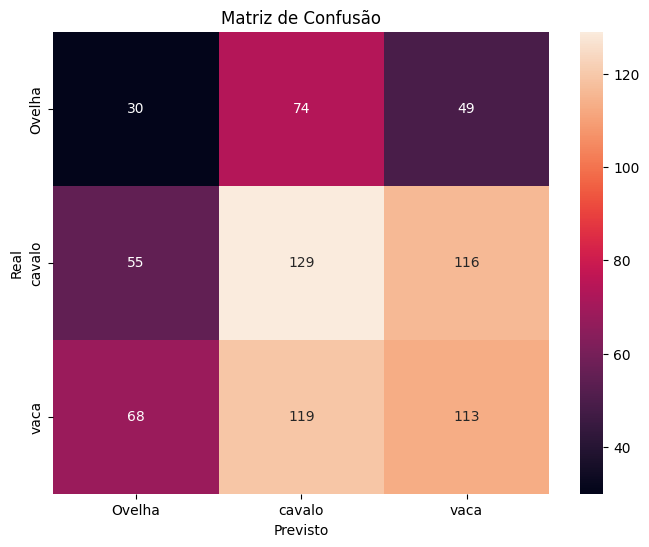

In [ ]:
val_gen.reset()

pred = model.predict(val_gen)
pred_classes = np.argmax(pred, axis=1)
true_classes = val_gen.classes
class_labels = list(val_gen.class_indices.keys())

print(classification_report(true_classes, pred_classes, target_names=class_labels))

cm = confusion_matrix(true_classes, pred_classes)

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=class_labels, yticklabels=class_labels)
plt.title("Matriz de Confusão")
plt.ylabel("Real")
plt.xlabel("Previsto")
plt.show()


# **Carregar o JSON no seu projeto**

In [ ]:
import tensorflow as tf

# The path to your TFLite model file
model_path = '/content/drive/MyDrive/Dataserts_Projeto PI/modelo_final.tflite'

# Load the TFLite model and allocate tensors
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

# Now you can interact with the model using the interpreter object
# (e.g., get input/output details, run inference, etc.)
print("TFLite model loaded successfully.")

TFLite model loaded successfully.


/usr/local/lib/python3.12/dist-packages/tensorflow/lite/python/interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


# **Criar um banco de perguntas por animal**

In [ ]:
def gerar_perguntas(animal):
    info = bd[animal]

    perguntas = [
        {
            "pergunta": f"Qual é a principal característica da {animal}?",
            "resposta": info["descricao"]
        },
        {
            "pergunta": f"Quanto pesa uma {animal} aproximadamente?",
            "resposta": info["peso"]
        },
        {
            "pergunta": f"Qual é a idade média de uma {animal}?",
            "resposta": info["idade_media"]
        },
        {
            "pergunta": f"Me diga uma curiosidade sobre a {animal}.",
            "resposta": info["curiosidades"]
        }
    ]
    return perguntas


# **Implementar NLP simples para comparar respostas**

In [ ]:
from difflib import SequenceMatcher

def similaridade(a, b):
    return SequenceMatcher(None, a.lower(), b.lower()).ratio()

def resposta_correta(resposta_usuario, resposta_modelo):
    return similaridade(resposta_usuario, resposta_modelo) >= 0.4


# **Criar o sistema de gamificação (loop de perguntas)**

In [ ]:
import random

def jogar_quiz(animal):
    perguntas = gerar_perguntas(animal)
    random.shuffle(perguntas)

    pontos = 0

    for q in perguntas:
        print(q["pergunta"])
        resp = input("Sua resposta: ")

        if resposta_correta(resp, q["resposta"]):
            print("✔ Acertou!")
            pontos += 1
        else:
            print("❌ Não foi bem… a resposta era:")
            print(q["resposta"])

        print("-" * 40)

        if pontos >= 4:
            break

    print(f"Pontuação final: {pontos}")
    if pontos >= 4:
        print("🎉 Parabéns! Você ganhou a rodada!")
    else:
        print("Tente novamente!")


# **Preparando Dados do quiz do chatbot**

In [ ]:
# ===============================================
# 🔹 MÓDULO DO QUIZ GAMIFICADO (4 alternativas)
# ===============================================

def gerar_perguntas(animal):
    info = base_conhecimento[animal]
    return [
        {"pergunta": f"Qual é a principal característica da {animal}?", "resposta": info["descricao"]},
        {"pergunta": f"Quanto pesa uma {animal} aproximadamente?", "resposta": info["peso"]},
        {"pergunta": f"Qual é a idade média de uma {animal}?", "resposta": info["idade_media"]},
        {"pergunta": f"Me diga uma curiosidade sobre a {animal}.", "resposta": info["curiosidades"]},
    ]

def gerar_alternativas(resposta_correta, animal):
    # Pega respostas de outros animais para alternativas erradas
    erradas = []
    for a, info in base_conhecimento.items():
        if a != animal:
            erradas.extend(info.values())

    alternativas = random.sample(erradas, 3) + [resposta_correta]
    random.shuffle(alternativas)
    return alternativas

def jogar_quiz(animal):
    perguntas = gerar_perguntas(animal)
    random.shuffle(perguntas)
    pontos = 0
    letras = ["A", "B", "C", "D"]

    print("\n🎮 Vamos começar o quiz! Responda 4 perguntas corretamente para vencer! 🎉")

    for q in perguntas:
        print("\n" + q["pergunta"])
        alternativas = gerar_alternativas(q["resposta"], animal)

        # exibe alternativas
        for i, alt in enumerate(alternativas):
            print(f"{letras[i]}) {alt}")

        escolha = input("\nEscolha a alternativa (A, B, C, D): ").upper()
        correta = alternativas.index(q["resposta"])

        if escolha == letras[correta]:
            print("✔ Muito bem, você acertou!")
            pontos += 1
        else:
            print("❌ Não foi dessa vez... A resposta correta era:")
            print(q["resposta"])

        print("-" * 40)

        if pontos >= 4:
            break

    print(f"\nPontuação final: {pontos}")

    if pontos >= 4:
        print("🎉🏆 Parabéns! Você ganhou o jogo! 🏆🎉")
    else:
        print("😊 Não desistir! Tente novamente quando quiser!")

# =========================================
# 🔹 CHAT INTERATIVO (NLP) SOBRE O ANIMAL
# =========================================

def chat_sobre_animal(animal):
    info = base_conhecimento[animal]

    print("\n💬 Agora você pode fazer perguntas sobre o animal!")
    print("Digite 'sair' para encerrar a conversa.\n")

    while True:
        pergunta = input("Você: ").lower().strip()

        if pergunta in ("sair", "exit", "parar"):
            print("Chat encerrado! 😊")
            break

        # regras simples de NLP
        if "descri" in pergunta:
            print("🤖:", info["descricao"])

        elif "peso" in pergunta:
            print("🤖:", info["peso"])

        elif "idade" in pergunta or "vive" in pergunta:
            print("🤖:", info["idade_media"])

        elif "curios" in pergunta or "fato" in pergunta:
            print("🤖:", info["curiosidades"])

        else:
            print("🤖: Não tenho uma resposta exata, mas posso te contar isso:")
            print("👉", info["curiosidades"])


# **CHATBOT**

In [ ]:
# Re-define necessary variables from a35f2ea7 to ensure train_gen is available for class_indices
train_dir = '/content/drive/MyDrive/Dataserts_Projeto PI/Dataset_teste/DatasetPI_teste/train'
val_dir   = '/content/drive/MyDrive/Dataserts_Projeto PI/Dataset_teste/DatasetPI_teste/val'
batch_size = 32
img_size = (224, 224)

# 3) Image Generators (Data Augmentation) - Used to get class_indices
train_gen = ImageDataGenerator(
    horizontal_flip=True,
    rotation_range=15,
    width_shift_range=0.05,
    height_shift_range=0.05,
    brightness_range=(0.8, 1.2)
).flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

val_gen = ImageDataGenerator().flow_from_directory(
    val_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)


# -----------------------------------------------------
# 1. Carregar JSON de conhecimento
# -----------------------------------------------------
with open("/content/drive/MyDrive/Dataserts_Projeto PI/base_de_conhecimento.json", "r", encoding="utf-8") as f:
    base_conhecimento = json.load(f)

# Normalizar chaves
base_conhecimento = {k.lower(): v for k, v in base_conhecimento.items()}


# -----------------------------------------------------
# Função para prever a imagem usando o modelo TFLite
# -----------------------------------------------------
def prever_imagem(img):
    # Load the TFLite model and allocate tensors.
    interpreter = tf.lite.Interpreter(model_path="/content/drive/MyDrive/Dataserts_Projeto PI/modelo_final.tflite")
    interpreter.allocate_tensors()

    # Get input and output details
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    # Create a mapping from class indices to class names
    class_indices = train_gen.class_indices
    idx_to_class = {v: k for k, v in class_indices.items()}

    # Preprocess the input image
    img_resized = img.resize(img_size, Image.Resampling.LANCZOS) # Use LANCZOS for high-quality downsampling
    img_array = image.img_to_array(img_resized)
    img_array = np.expand_dims(img_array, axis=0) # Add batch dimension
    img_array = tf.keras.applications.mobilenet_v2.preprocess_input(img_array)

    # Set the tensor
    interpreter.set_tensor(input_details[0]['index'], img_array)

    # Invoke the interpreter
    interpreter.invoke()

    # Get the output tensor
    output_data = interpreter.get_tensor(output_details[0]['index'])

    # Get predicted class and probability
    predicted_class_index = np.argmax(output_data)
    predicted_probability = np.max(output_data)
    predicted_class_name = idx_to_class[predicted_class_index]

    return predicted_class_name, predicted_probability


# -----------------------------------------------------
# 2. Função para rodar impacto do modelo + chatbot
# -----------------------------------------------------
def analisar_imagem(img):

    # Aqui usamos a função do seu modelo (MobileNetV2)
    classe, prob = prever_imagem(img)

    classe = classe.lower()

    if classe in base_conhecimento:
        dados = base_conhecimento[classe]

        return f"""
Animal detectado: **{classe.capitalize()}** 🐾
Confiança: {prob*100:.2f}%

📌 Descrição: {dados['descricao']}
📏 Peso médio: {dados['peso']}
⏳ Idade média: {dados['idade_media']}
✨ Curiosidade: {dados['curiosidades']}
"""
    else:
        return f"Animal detectado: {classe}, porém não encontrei informações no JSON."


# -----------------------------------------------------
# 3. Função para processar o menu
# -----------------------------------------------------
def processar_resposta(resposta, nome):
    if resposta == "1":

        print("\n📸 Faça upload da imagem do animal aqui!\n")

        # Exibe exatamente o botão da imagem 1
        uploaded = files.upload()

        for fn in uploaded.keys():
            print(f"Arquivo recebido: {fn}")

            img_bytes = uploaded[fn]
            img = Image.open(io.BytesIO(img_bytes))

            # Rodar modelo + chatbot
            resultado = analisar_imagem(img)
            print(resultado)

            # Após mostrar os dados do animal, perguntar sobre o quiz
            animal_detectado = resultado.split("**")[1].split("**")[0].lower()  # extrai o nome do animal

            opcao_quiz = input("\nVocê gostaria de participar do quiz sobre este animal? (sim/não): ").strip().lower()

            if opcao_quiz == "sim":
                jogar_quiz(animal_detectado)
            else:
                print("Tudo bem! Se quiser jogar depois, é só falar! 😄")

            # Após o quiz ou se a criança disser não
            opcao_chat = input("\nDeseja conversar sobre este animal? (sim/não): ").strip().lower()

            if opcao_chat == "sim":
                chat_sobre_animal(animal_detectado)
            else:
                print("Tudo bem! Se quiser conversar depois, estou aqui! 😄")


        return ""

    else:
        return "Opção inválida. Digite apenas '1' ou 'sair'."


# -----------------------------------------------------
# 4. Chatbot principal
# -----------------------------------------------------
def start():
    nome = input("Digite seu nome: ")

    while True:

        menu = f"""
Olá {nome}, bem-vindo!

Se você deseja Fazer upload da imagem do animal aqui digite '1'.

Se você deseja sair Digite '2' para encerrar.
"""

        resposta = input(menu).strip()

        if resposta.lower() in ("2", "exit", "0"):
            print(f"\nObrigado por usar o ChatBot, {nome}! Até mais.")
            break

        saida = processar_resposta(resposta, nome)
        print(saida)


# -----------------------------------------------------
# Execução
# -----------------------------------------------------
start()

Found 1409 images belonging to 3 classes.
Found 753 images belonging to 3 classes.
Digite seu nome: Sanderson

Olá Sanderson, bem-vindo!

Se você deseja Fazer upload da imagem do animal aqui digite '1'.

Se você deseja sair Digite '2' para encerrar.
1

📸 Faça upload da imagem do animal aqui!



/usr/local/lib/python3.12/dist-packages/tensorflow/lite/python/interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


Saving Cavalo.jpg to Cavalo (2).jpg
Arquivo recebido: Cavalo (2).jpg

Animal detectado: **Cavalo** 🐾
Confiança: 73.37%

📌 Descrição: O cavalo é um mamífero perissodáctilo domesticado, conhecido por sua força, velocidade e beleza. É usado para transporte, trabalho agrícola, esportes e lazer.
📏 Peso médio: Varia de 380 kg a 1000 kg, dependendo da raça.
⏳ Idade média: Cerca de 25 a 30 anos.
✨ Curiosidade: Cavalos conseguem dormir em pé e possuem um campo de visão de quase 360 graus.


Você gostaria de participar do quiz sobre este animal? (sim/não): sim

🎮 Vamos começar o quiz! Responda 4 perguntas corretamente para vencer! 🎉

Qual é a idade média de uma cavalo?
A) As ovelhas são muito inteligentes e conseguem reconhecer rostos humanos e de outras ovelhas por até dois anos.
B) Cerca de 25 a 30 anos.
C) Geralmente entre 45 kg e 160 kg, dependendo da raça e do sexo.
D) A vaca é um mamífero bovino, geralmente criado para produção de leite, carne e couro. Existem diversas raças, cada uma com 

Saving Cavalo.jpg to Cavalo (3).jpg
Arquivo recebido: Cavalo (3).jpg

Animal detectado: **Cavalo** 🐾
Confiança: 73.37%

📌 Descrição: O cavalo é um mamífero perissodáctilo domesticado, conhecido por sua força, velocidade e beleza. É usado para transporte, trabalho agrícola, esportes e lazer.
📏 Peso médio: Varia de 380 kg a 1000 kg, dependendo da raça.
⏳ Idade média: Cerca de 25 a 30 anos.
✨ Curiosidade: Cavalos conseguem dormir em pé e possuem um campo de visão de quase 360 graus.


Você gostaria de participar do quiz sobre este animal? (sim/não): sim

🎮 Vamos começar o quiz! Responda 4 perguntas corretamente para vencer! 🎉

Qual é a principal característica da cavalo?
A) Geralmente entre 500 kg e 1000 kg, dependendo da raça.
B) Cerca de 18 a 22 anos, mas na pecuária a vida útil é menor.
C) O cavalo é um mamífero perissodáctilo domesticado, conhecido por sua força, velocidade e beleza. É usado para transporte, trabalho agrícola, esportes e lazer.
D) A vaca é um mamífero bovino, geralmen

In [ ]:
def chatbot_msg(texto):
    texto = texto.lower()

    if "jogar" in texto or "quiz" in texto:
        return "Ok! Me envie uma imagem de um animal e vamos começar a brincadeira! 🐮🐴🐑"

    if "oi" in texto or "olá" in texto:
        return "Olá! Vamos aprender sobre animais hoje? 😊"

    return "Não entendi… você quer jogar o quiz ou saber sobre algum animal?"
